# Context-Free Grammars

NTLK has a module for building context-free grammars from a string representation of the rules. Let's start by creating our toy grammar from the lecture, and generating the four possible sentences that can be derived using it.

In [1]:
import nltk
from nltk.parse.generate import generate
toy_grammar = nltk.CFG.fromstring("""
  S -> NP VP
  VP -> VBD NP 
  VBD -> "ate"
  NP -> DT NN
  DT -> "the"
  NN -> "rat" | "cheese" 
  """)

for sentence in generate(toy_grammar):
    print(sentence)

['the', 'rat', 'ate', 'the', 'rat']
['the', 'rat', 'ate', 'the', 'cheese']
['the', 'cheese', 'ate', 'the', 'rat']
['the', 'cheese', 'ate', 'the', 'cheese']


Let's examine our grammar a bit. We can iterate through the rules (productions), look at the symbols on their left hand and right hand sides, and see whether they're terminals or non-terminals. We'll do this to create a list of terminals and non-terminals

In [2]:
terminals = set()
nonterminals = set()
for production in toy_grammar.productions():
    print (production)
    print ("\tlhs", production.lhs())
    print ("\trhs", production.rhs())
    for symbol in production.rhs():
        if nltk.grammar.is_terminal(symbol):
            terminals.add(symbol)
        else:
            nonterminals.add(symbol)

print("terminals")
print(terminals)
print("nonterminals")
print(nonterminals)

S -> NP VP
	lhs S
	rhs (NP, VP)
VP -> VBD NP
	lhs VP
	rhs (VBD, NP)
VBD -> 'ate'
	lhs VBD
	rhs ('ate',)
NP -> DT NN
	lhs NP
	rhs (DT, NN)
DT -> 'the'
	lhs DT
	rhs ('the',)
NN -> 'rat'
	lhs NN
	rhs ('rat',)
NN -> 'cheese'
	lhs NN
	rhs ('cheese',)
terminals
{'the', 'rat', 'ate', 'cheese'}
nonterminals
{NP, VBD, DT, VP, NN}


Here's some CYK code showing the basic construction of a chart. A full implementation would need to also include backpointers, in order to create the parse tree, among other things. 

In [3]:
from collections import defaultdict

def parse_CYK(tokens, grammar, trace=False): 
    length = len(tokens)

    # table holds (i,j) -> [non-terminals]
    table = defaultdict(set)
    
    # index binary productions in grammar 
    grammar_index = defaultdict(set)
    for prod in grammar.productions():
        if len(prod.rhs()) == 2:
            grammar_index[prod.rhs()].add(prod.lhs())
    
    for j in range(1,length+1):
        for preterm_prod in grammar.productions(rhs=tokens[j-1]):
            assert len(preterm_prod.rhs()) == 1
            table[j-1,j].add(preterm_prod.lhs())
            if trace:
                print("[%s] %3s [%s] ==> [%s] %3s [%s]" % (j-1, tokens[j-1], j, j-1, preterm_prod.lhs(), j))
    
        for i in range(j-2,-1,-1):
            for k in range(i+1, j):
                for B in table[i,k]:
                    for C in table[k,j]:
                        for A in grammar_index[(B,C)]:
                            table[i,j].add(A)
                            if trace:
                                print("[%s] %3s [%s] %3s [%s] ==> [%s] %3s [%s]" % (i, B, k, C, j, i, A, j))
    return table

def display(chart, tokens):
    print('\nchart ' + ' '.join([("%-5d" % i) for i in range(1, len(tokens)+1)])) 
    for i in range(len(tokens)):
        print("%-4d " % i, end=' ')
        for j in range(1, len(tokens)+1):
            if chart[i,j]:
                print("%-5s" % chart[i,j], end=' ') 
            else:
                print("%-5s" % '.', end=' ') 
        print()

In [4]:
tokens = "the rat ate the cheese".split()
table = parse_CYK(tokens, toy_grammar, True)
display(table, tokens)

[0] the [1] ==> [0]  DT [1]
[1] rat [2] ==> [1]  NN [2]
[0]  DT [1]  NN [2] ==> [0]  NP [2]
[2] ate [3] ==> [2] VBD [3]
[3] the [4] ==> [3]  DT [4]
[4] cheese [5] ==> [4]  NN [5]
[3]  DT [4]  NN [5] ==> [3]  NP [5]
[2] VBD [3]  NP [5] ==> [2]  VP [5]
[0]  NP [2]  VP [5] ==> [0]   S [5]

chart 1     2     3     4     5    
0     {DT}  {NP}  .     .     {S}   
1     .     {NN}  .     .     .     
2     .     .     {VBD} .     {VP}  
3     .     .     .     {DT}  {NP}  
4     .     .     .     .     {NN}  


This mirrors the chart we derived in the lecture.

## Earley parsing

For the rest of the notebook we will use the Earley Parser, as it's more mature code, and will produce the same set of parse trees. 

This has similarities to the CYK algorithm covered in class, but constructs the partial parse structures in the chart in a different order. Note that NLTK has several different ChartParsing methods, but does not include CYK. We can set trace=2 to show the steps that the model is taking.

In [5]:
parser = nltk.parse.EarleyChartParser(toy_grammar, trace=1)
for parse in parser.parse("the rat ate the cheese".split()):
    print(parse)

|.  the  .  rat  .  ate  .  the  . cheese.|
|[-------]       .       .       .       .| [0:1] 'the'
|.       [-------]       .       .       .| [1:2] 'rat'
|.       .       [-------]       .       .| [2:3] 'ate'
|.       .       .       [-------]       .| [3:4] 'the'
|.       .       .       .       [-------]| [4:5] 'cheese'
|>       .       .       .       .       .| [0:0] S  -> * NP VP
|>       .       .       .       .       .| [0:0] NP -> * DT NN
|>       .       .       .       .       .| [0:0] DT -> * 'the'
|[-------]       .       .       .       .| [0:1] DT -> 'the' *
|[------->       .       .       .       .| [0:1] NP -> DT * NN
|.       >       .       .       .       .| [1:1] NN -> * 'rat'
|.       [-------]       .       .       .| [1:2] NN -> 'rat' *
|[---------------]       .       .       .| [0:2] NP -> DT NN *
|[--------------->       .       .       .| [0:2] S  -> NP * VP
|.       .       >       .       .       .| [2:2] VP -> * VBD NP
|.       .       >       .      

## Towards a real grammar


Let's try to go beyond our toy grammar. Building one by hand would be painful, but fortunately NLTK contains a portion of the human-annotated Penn Treebank, which we can use for learning a grammar. First, though, let's take a look at some trees from the Penn Treebank

In [6]:
for tree in nltk.corpus.treebank.parsed_sents()[0:5]:
      print(tree)

(S
  (NP-SBJ
    (NP (NNP Pierre) (NNP Vinken))
    (, ,)
    (ADJP (NP (CD 61) (NNS years)) (JJ old))
    (, ,))
  (VP
    (MD will)
    (VP
      (VB join)
      (NP (DT the) (NN board))
      (PP-CLR (IN as) (NP (DT a) (JJ nonexecutive) (NN director)))
      (NP-TMP (NNP Nov.) (CD 29))))
  (. .))
(S
  (NP-SBJ (NNP Mr.) (NNP Vinken))
  (VP
    (VBZ is)
    (NP-PRD
      (NP (NN chairman))
      (PP
        (IN of)
        (NP
          (NP (NNP Elsevier) (NNP N.V.))
          (, ,)
          (NP (DT the) (NNP Dutch) (VBG publishing) (NN group))))))
  (. .))
(S
  (NP-SBJ-1
    (NP (NNP Rudolph) (NNP Agnew))
    (, ,)
    (UCP
      (ADJP (NP (CD 55) (NNS years)) (JJ old))
      (CC and)
      (NP
        (NP (JJ former) (NN chairman))
        (PP
          (IN of)
          (NP (NNP Consolidated) (NNP Gold) (NNP Fields) (NNP PLC)))))
    (, ,))
  (VP
    (VBD was)
    (VP
      (VBN named)
      (S
        (NP-SBJ (-NONE- *-1))
        (NP-PRD
          (NP (DT a) (JJ nonexecutive) (N

One problem with the default Penn Treebank annotation is that some of its nonterminals include sentential grammatical role labels which don't make sense for building a CFG grammar (for instance, NP-SBJ for NPs as the subject as the sentence). Let's write a function to remove them. To do this, we'll have to traverse these trees, and change the labels on the nodes. This is fairly easy, since iterating over a NLTK tree with a for loop means to interate over its children

In [7]:
def remove_grammatical_roles(tree):
    try:
        if "-" in tree.label():
            tree.set_label(tree.label().split("-")[0])
    except: #we've hit a terminal node
        return 
    for child in tree:
        remove_grammatical_roles(child)

for tree in nltk.corpus.treebank.parsed_sents()[0:5]:
    remove_grammatical_roles(tree)
    print(tree)

(S
  (NP
    (NP (NNP Pierre) (NNP Vinken))
    (, ,)
    (ADJP (NP (CD 61) (NNS years)) (JJ old))
    (, ,))
  (VP
    (MD will)
    (VP
      (VB join)
      (NP (DT the) (NN board))
      (PP (IN as) (NP (DT a) (JJ nonexecutive) (NN director)))
      (NP (NNP Nov.) (CD 29))))
  (. .))
(S
  (NP (NNP Mr.) (NNP Vinken))
  (VP
    (VBZ is)
    (NP
      (NP (NN chairman))
      (PP
        (IN of)
        (NP
          (NP (NNP Elsevier) (NNP N.V.))
          (, ,)
          (NP (DT the) (NNP Dutch) (VBG publishing) (NN group))))))
  (. .))
(S
  (NP
    (NP (NNP Rudolph) (NNP Agnew))
    (, ,)
    (UCP
      (ADJP (NP (CD 55) (NNS years)) (JJ old))
      (CC and)
      (NP
        (NP (JJ former) (NN chairman))
        (PP
          (IN of)
          (NP (NNP Consolidated) (NNP Gold) (NNP Fields) (NNP PLC)))))
    (, ,))
  (VP
    (VBD was)
    (VP
      (VBN named)
      (S
        (NP ( *-1))
        (NP
          (NP (DT a) (JJ nonexecutive) (NN director))
          (PP
            (

Now let's build a new grammar. NLTK trees have a handy method (productions()) which gives you all the CFG rules for the tree. We can collect these rules across all the texts to build a new CFG

In [8]:
from nltk.grammar import CFG,Nonterminal

productions = set()

for tree in nltk.corpus.treebank.parsed_sents():
    remove_grammatical_roles(tree)
    for production in tree.productions():
        productions.add(production)
treebank_grammar = CFG(Nonterminal('S'), list(productions))
print(len(treebank_grammar.productions()))

17616


Whereas our old grammar had 7 rules, this one has over 17 thousand. Many of them, however, are the lexical rules which produce terminals nodes. Let's see how many of them are non-lexical by counting only those whose RHS is not a terminal.

In [9]:
nonlex_count = 0
for production in treebank_grammar.productions():
    if not nltk.grammar.is_terminal(production.rhs()[0]):
        nonlex_count +=1
print(nonlex_count)

3835


That's still a lot of rules. Let's see if it can parse our original sentence

In [10]:
parser = nltk.parse.EarleyChartParser(treebank_grammar, trace=0)
for parse in parser.parse("the rat ate the cheese".split()):
    print(parse)

ValueError: Grammar does not cover some of the input words: "'rat', 'ate', 'cheese'".

No, because it was built on Wall Street Journal texts, it doesn't know about rats, cheese, or even eating, these words are out of vocabulary (OOV). Unfortunately, even when the vocabulary of sentence is covered, the grammar is completely unusable (in this context). To demonstrate why, try running the below, though note that it might crash your iPython notebook session. We have switched to a bottom up parser which works a bit better in this situation.

In [11]:
parser = nltk.parse.BottomUpChartParser(treebank_grammar, trace=0)
for parse in parser.parse("revenue increased last quarter".split()):
    print(parse)

(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (ADJP (NN last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (ADJP (VB last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (ADJP (JJ last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (ADJP (RB last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (NP (NN last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (NP (NP (NN last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (NP (NP (VB last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (NP (NP (JJ last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (RRC (VP (VBD increased) (FRAG (NP (NP (RB last)))))))
  (ADJP (NN quarter)))


(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (RRC (VP (VP (VBD increased) (NP (NP (JJ last))))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (RRC (VP (VP (VBD increased) (NP (NP (RB last))))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (RRC (VP (VP (VBD increased) (NP (NP (QP (RB last)))))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (RRC (VP (VP (VBD increased) (NP (VB last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (RRC (VP (VP (VBD increased) (NP (JJ last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (RRC (VP (VP (VBD increased) (NP (RB last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (RRC (VP (VP (VBD increased) (NP (QP (RB last))))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (RRC (VP (VP (VP (VBN increased)) (NP (NN last)))))))
 

  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (ADJP (VBN increased)))
      (FRAG (ADJP (NN last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (ADJP (VBN increased)))
      (FRAG (ADJP (VB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (ADJP (VBN increased)))
      (FRAG (ADJP (JJ last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (ADJP (VBN increased)))
      (FRAG (ADJP (RB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
      (FRAG (ADJP (NN last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
      (FRAG (ADJP (VB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
      (FRAG (ADJP (JJ last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
      (FRAG (ADJP (R

(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased)))))
      (X (NP (NN last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased)))))
      (X (NP (NP (NN last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased)))))
      (X (NP (NP (VB last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased)))))
      (X (NP (NP (JJ last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased)))))
      (X (NP (NP (RB last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased)))))
      (X (NP (NP (QP (RB last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased)))))
      (X (NP (VB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP
 

(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (FRAG (ADVP (NN last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (FRAG (ADVP (JJ last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (FRAG (ADVP (RB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (FRAG (PP (RB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VBD increased) (FRAG (ADJP (NN last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VBD increased) (FRAG (ADJP (VB last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VBD increased) (FRAG (ADJP (JJ last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VBD increased) (FRAG (ADJP (RB last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VBD increased) (FRAG (NP (NN last))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NN re

  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (FRAG
      (SBAR (SINV (VP (VP (VBN increased))) (NP (NP (JJ last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (FRAG
      (SBAR (SINV (VP (VP (VBN increased))) (NP (NP (RB last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (FRAG
      (SBAR
        (SINV (VP (VP (VBN increased))) (NP (NP (QP (RB last))))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (FRAG
      (SBAR (SINV (VP (VP (VBD increased))) (NP (NP (NN last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (FRAG
      (SBAR (SINV (VP (VP (VBD increased))) (NP (NP (VB last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (FRAG
      (SBAR (SINV (VP (VP (VBD increased))) (NP (NP (JJ last)))))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (FRAG
      (SBAR (SINV (VP (VP (VBD increased))) (NP (NP (RB last)))))))
  (ADJP (NN quarter)))
(S
  

(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VBN increased)) (NP (JJ last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VP (VBN increased))) (NP (JJ last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VP (VBD increased))) (NP (JJ last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VBD increased)) (NP (JJ last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VBN increased)) (NP (RB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VP (VBN increased))) (NP (RB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VP (VBD increased))) (NP (RB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VBD increased)) (NP (RB last)))))
  (ADJP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (PRN (SINV (VP (VBN increased)) (NP 

(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (ADJP (JJ last) (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (ADJP (JJ last) (NP (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBD increased))))
  (ADJP (JJ last) (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBD increased))))
  (ADJP (JJ last) (NP (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
  (ADJP (JJ last) (NP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
  (ADJP (JJ last) (NP (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (ADJP (JJ last) (NP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (ADJP (JJ last) (NP (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (VP (VBD increased)))
  (ADJP (JJ last) (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VBD increased)))
  (ADJP (JJ last) (NP (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (VP (VBD incr

  (ADJP (NN quarter)))
(S
  (S
    (NP (NP (NP (NN revenue))) (VP (VBD increased)))
    (NP (QP (RB last))))
  (ADJP (NN quarter)))
(S
  (S (NP (NN revenue)) (ADJP (VBN increased)) (NP (NN last)))
  (ADJP (NN quarter)))
(S
  (S (NP (NP (NN revenue))) (ADJP (VBN increased)) (NP (NN last)))
  (ADJP (NN quarter)))
(S
  (S (NP (NN revenue)) (ADJP (VBD increased)) (NP (NN last)))
  (ADJP (NN quarter)))
(S
  (S (NP (NP (NN revenue))) (ADJP (VBD increased)) (NP (NN last)))
  (ADJP (NN quarter)))
(S
  (S (NP (NN revenue)) (ADJP (VBN increased)) (NP (NP (NN last))))
  (ADJP (NN quarter)))
(S
  (S (NP (NN revenue)) (ADJP (VBN increased)) (NP (NP (VB last))))
  (ADJP (NN quarter)))
(S
  (S (NP (NN revenue)) (ADJP (VBN increased)) (NP (NP (JJ last))))
  (ADJP (NN quarter)))
(S
  (S (NP (NN revenue)) (ADJP (VBN increased)) (NP (NP (RB last))))
  (ADJP (NN quarter)))
(S
  (S
    (NP (NN revenue))
    (ADJP (VBN increased))
    (NP (NP (QP (RB last)))))
  (ADJP (NN quarter)))
(S
  (S
    (NP (NP (NN 

      (NP (NP (NP (NP (NN last))) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VBD increased)
      (NP (NP (NP (NP (VB last))) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VBD increased)
      (NP (NP (NP (NP (JJ last))) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VBD increased)
      (NP (NP (NP (NP (RB last))) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VBD increased)
      (NP (NP (NP (NP (QP (RB last)))) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP (VBD increased) (NP (NP (NP (VB last)) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP (VBD increased) (NP (NP (NP (JJ last)) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP (VBD increased) (NP (NP (NP (RB last)) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VBD increased)
      (NP (NP (NP (QP (RB last))) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VBD increased)
  

      (NP (NP (NN quarter))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VP (VP (VBD increased) (FRAG (NP (RB last)))))
      (NP (NP (NN quarter))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VP (VP (VBD increased) (FRAG (NP (QP (RB last))))))
      (NP (NP (NN quarter))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VP (VP (VBD increased) (FRAG (ADVP (NN last)))))
      (NP (NP (NN quarter))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VP (VP (VBD increased) (FRAG (ADVP (JJ last)))))
      (NP (NP (NN quarter))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VP (VP (VBD increased) (FRAG (ADVP (RB last)))))
      (NP (NP (NN quarter))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VP (VP (VBD increased) (FRAG (PP (RB last)))))
      (NP (NP (NN quarter))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VP (VP (VBD increased) (ADJP (NN last))))
      (NP (NP (NN quarter))))))
(S
  (NP (NN revenue))
  (VP
    (VP
      (VP (VP (VBD increased) (ADJP (VB last))))
      (NP (NP (

(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased) (FRAG (NP (NP (JJ last) (NX (NN quarter))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VBD increased)
      (FRAG (NP (NP (NP (NN last)) (NX (NP (NN quarter)))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VBD increased)
      (FRAG (NP (NP (NP (NN last)) (NX (NP (NP (NN quarter))))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VBD increased)
      (FRAG (NP (NP (NP (NP (NN last))) (NX (NP (NN quarter)))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VBD increased)
      (FRAG
        (NP (NP (NP (NP (NN last))) (NX (NP (NP (NN quarter))))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VBD increased)
      (FRAG (NP (NP (NP (NP (VB last))) (NX (NP (NN quarter)))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VBD increased)
      (FRAG
        (NP (NP (NP (NP (VB last))) (NX (NP (NP (NN quarter))))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VBD increased)
      (FRAG

      (NP (NP (NP (QP (RB last)))) (FRAG (ADVP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBD increased)))
      (NP (NP (VB last)) (FRAG (ADVP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBD increased)))
      (NP (NP (JJ last)) (FRAG (ADVP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBD increased)))
      (NP (NP (RB last)) (FRAG (ADVP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBD increased)))
      (NP (NP (QP (RB last))) (FRAG (ADVP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VBD increased))
      (NP (NP (NN last)) (FRAG (ADJP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VBD increased))
      (NP (NP (NP (NN last))) (FRAG (ADJP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VBD increased))
      (NP (NP (NP (VB last))) (FRAG (ADJP (NN quarter)))))))
(S
  (NP (NP (NN revenue

(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBN increased)))
      (NP (NP (NP (QP (RB last)))) (RRC (VP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBN increased)))
      (NP (NP (NP (QP (RB last)))) (RRC (VP (VP (NN quarter))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBN increased)))
      (NP (NP (VB last)) (RRC (VP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBN increased)))
      (NP (NP (VB last)) (RRC (VP (VP (NN quarter))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBN increased)))
      (NP (NP (JJ last)) (RRC (VP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBN increased)))
      (NP (NP (JJ last)) (RRC (VP (VP (NN quarter))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBN increased)))
      (NP (NP (RB last)) (RRC (VP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP
      (VP (VP (VBN increased)))
  

(S
  (NP (NN revenue))
  (VP (VBD increased) (FRAG (NP (NP (JJ last) (NX (NN quarter)))))))
(S
  (NP (NN revenue))
  (VP
    (VBD increased)
    (FRAG (NP (NP (NP (NN last)) (NX (NP (NN quarter))))))))
(S
  (NP (NN revenue))
  (VP
    (VBD increased)
    (FRAG (NP (NP (NP (NN last)) (NX (NP (NP (NN quarter)))))))))
(S
  (NP (NN revenue))
  (VP
    (VBD increased)
    (FRAG (NP (NP (NP (NP (NN last))) (NX (NP (NN quarter))))))))
(S
  (NP (NN revenue))
  (VP
    (VBD increased)
    (FRAG (NP (NP (NP (NP (NN last))) (NX (NP (NP (NN quarter)))))))))
(S
  (NP (NN revenue))
  (VP
    (VBD increased)
    (FRAG (NP (NP (NP (NP (VB last))) (NX (NP (NN quarter))))))))
(S
  (NP (NN revenue))
  (VP
    (VBD increased)
    (FRAG (NP (NP (NP (NP (VB last))) (NX (NP (NP (NN quarter)))))))))
(S
  (NP (NN revenue))
  (VP
    (VBD increased)
    (FRAG (NP (NP (NP (NP (JJ last))) (NX (NP (NN quarter))))))))
(S
  (NP (NN revenue))
  (VP
    (VBD increased)
    (FRAG (NP (NP (NP (NP (JJ last))) (NX (NP (NP

(S
  (NP (NP (NN revenue)))
  (VP
    (VBD increased)
    (NP (NP (NP (RB last)) (RRC (VP (VP (NN quarter))))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VBD increased)
    (NP (NP (NP (QP (RB last))) (RRC (VP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VBD increased)
    (NP (NP (NP (QP (RB last))) (RRC (VP (VP (NN quarter))))))))
(S
  (NP (NP (NN revenue)))
  (VP (VBD increased) (NP (NP (NP (NN last)) (VP (NN quarter))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VBD increased)
    (NP (NP (NP (NP (NN last))) (VP (NN quarter))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VBD increased)
    (NP (NP (NP (NP (VB last))) (VP (NN quarter))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VBD increased)
    (NP (NP (NP (NP (JJ last))) (VP (NN quarter))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VBD increased)
    (NP (NP (NP (NP (RB last))) (VP (NN quarter))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VBD increased)
    (NP (NP (NP (NP (QP (RB last)))) (VP (NN quarter))))))
(S
  (NP (NP 

(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VBD increased)) (NP (NP (QP (RB last))))))
    (NP (NP (NN quarter)))))
(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VBN increased)) (NP (VB last))))
    (NP (NP (NN quarter)))))
(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VP (VBN increased))) (NP (VB last))))
    (NP (NP (NN quarter)))))
(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VP (VBD increased))) (NP (VB last))))
    (NP (NP (NN quarter)))))
(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VBD increased)) (NP (VB last))))
    (NP (NP (NN quarter)))))
(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VBN increased)) (NP (JJ last))))
    (NP (NP (NN quarter)))))
(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VP (VBN increased))) (NP (JJ last))))
    (NP (NP (NN quarter)))))
(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VP (VBD increased))) (NP (JJ last))))
    (NP (NP (NN quarter)))))
(S
  (NP (NN revenue))
  (VP
    (VP (VP (VP (VBD increased)) (NP (JJ last))))
    (NP (NP (NN quarter))))

    (NP (NP (JJ last)) (NX (NP (NP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased))
    (NP (NP (RB last)) (NX (NP (NN quarter))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased))
    (NP (NP (RB last)) (NX (NP (NP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased))
    (NP (NP (QP (RB last))) (NX (NP (NN quarter))))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased))
    (NP (NP (QP (RB last))) (NX (NP (NP (NN quarter)))))))
(S
  (NP (NP (NN revenue)))
  (VP (VP (VBD increased)) (NP (NP (NN last)) (NX (NN quarter)))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased))
    (NP (NP (NP (NN last))) (NX (NN quarter)))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased))
    (NP (NP (NP (VB last))) (NX (NN quarter)))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased))
    (NP (NP (NP (JJ last))) (NX (NN quarter)))))
(S
  (NP (NP (NN revenue)))
  (VP
    (VP (VBD increased))
    (NP (NP (NP 

(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (VP (VP (JJ last) (VP (VP (NN quarter))))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (VP (VP (VB last) (VP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (VP (VP (VB last) (VP (VP (NN quarter))))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (VP (VP (NN last) (VP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (VP (VP (NN last) (VP (VP (NN quarter))))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased))))))
  (VP (VP (VB last) (ADJP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased))))))
  (VP (VP (JJ last) (NP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased))))))
  (VP (VP (JJ last) (NP (NP (NN quarter))))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased))))))
  (VP (VP (VB last) (NP (NN quarter)))))
(S
 

(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
  (VP (VP (VP (NN last))) (NP (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
  (VP (VP (VP (VB last))) (NP (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
  (VP (VP (VP (JJ last))) (NP (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
  (VP (VP (VB last)) (NP (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
  (VP (VP (JJ last)) (NP (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
  (VP (VP (NN last)) (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
  (VP (VP (VP (NN last))) (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
  (VP (VP (VP (VB last))) (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
  (VP (VP (VP (JJ last))) (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (RRC (VP 

  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (RRC (VP (VP (NN last))))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (RRC (VP (VP (VB last))))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (RRC (VP (VP (JJ last))))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (RRC (VP (VB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (RRC (VP (JJ last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (ADJP (VBD increased))))
      (RRC (VP (NN last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (ADJP (VBD increased))))
      (RRC (VP (VP (NN last))))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (ADJP (VBD increased))))
  

(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
      (FRAG (NP (NP (RB last))))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
      (FRAG (NP (NP (QP (RB last)))))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
      (FRAG (NP (VB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
      (FRAG (NP (JJ last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
      (FRAG (NP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
      (FRAG (NP (QP (RB last))))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
      (FRAG (NP (NN last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
      (FRAG (NP (NP (NN last)))))

  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased)))))
      (X (PP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBN increased))))
      (X (PP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (ADJP (VBN increased))))
      (X (PP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (X (PP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (ADJP (VBD increased))))
      (X (PP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (X (PP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
      (X (PP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased))))))
      (

(S
  (NP
    (NP (NP (NN revenue)) (VP (VP (VBD increased))))
    (VP (NN last)))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
    (VP (NN last)))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
    (VP (NN last)))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue)) (VP (VBD increased))) (VP (NN last)))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VBD increased)))
    (VP (NN last)))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (VP (VP (NN last))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (VP (VP (VB last))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (VP (VP (JJ last))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased))))
    (VP (VP (NN last))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG

(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NX (NP (NP (NN last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NX (NP (NP (VB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NX (NP (NP (JJ last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NX (NP (NP (RB last)))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NX (NP (NP (QP (RB last))))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NX (NP (VB last))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NX (NP (JJ last))))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NX (NP (RB last))))
  (VP (NN quarter)))
(S
  (NP
    (NP (

  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBD increased)) (VP (VB last)))
  (VP (NN quarter)))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)) (VP (JJ last)))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBN increased)) (VP (JJ last)))
  (VP (NN quarter)))
(S
  (NP (NP (NN revenue)) (ADJP (VBD increased)) (VP (JJ last)))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBD increased)) (VP (JJ last)))
  (VP (NN quarter)))
(S
  (NP (ADJP (ADVP (NN revenue)) (VBN increased)) (NN last))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))) (NN last))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased)))) (NN last))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBN increased))))
    (NN last))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
    (NN last))
  (VP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue)) (FRA

(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (VP (VBD increased) (FRAG (NP (JJ last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (VP (VBD increased) (FRAG (NP (RB last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (VP (VBD increased) (FRAG (NP (QP (RB last)))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (VP (VBD increased) (FRAG (ADVP (NN last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (VP (VBD increased) (FRAG (ADVP (JJ last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (VP (VBD increased) (FRAG (ADVP (RB last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (VP (VBD increased) (FRAG (PP (RB last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NN revenue))
      (VP (VP (VBD increased) (FRAG (ADJP (NN last)))))))
  (VP (VP (NN quarter))))
(S


  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (ADVP (NN last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (ADVP (JJ last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (ADVP (RB last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
      (FRAG (ADVP (NN last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
      (FRAG (ADVP (JJ last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
      (FRAG (ADVP (RB last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased))))))
      (FRAG (ADVP (NN last)))))
  (VP (VP (NN quarter))))
(S

(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (X (NP (NP (NN last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (X (NP (NP (VB last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (X (NP (NP (JJ last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (X (NP (NP (RB last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (X (NP (NP (QP (RB last)))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (X (NP (VB last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (X (NP (JJ last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (

(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VP (VBD increased))) (NP (RB last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VBD increased)) (NP (RB last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VBN increased)) (NP (QP (RB last)))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VP (VBN increased))) (NP (QP (RB last)))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VP (VBD increased))) (NP (QP (RB last)))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VBD increased)) (NP (QP (RB last)))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NN revenue))
      (PRN (S (ADJP (VBN increased)) (NP (NN last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP
      (NP (NN revenue))
      (PRN (S (ADJP (VBD in

(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (NP (NP (RB last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (NP (NP (QP (RB last))))))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VBD increased) (NP (VB last))))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VBD increased) (NP (JJ last))))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VBD increased) (NP (RB last))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (NP (QP (RB last)))))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased)) (NP (NN last))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VP (VBN increased))) (NP (NN last))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VP (VBD increased))) (NP (NN last))))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBD increased)) (NP (NN last))))
  (VP 

(S
  (NP
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NX (NP (NN last))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NX (NP (NP (NN last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NX (NP (NP (VB last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NX (NP (NP (JJ last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NX (NP (NP (RB last)))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NX (NP (NP (QP (RB last))))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NX (NP (VB last))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NX (NP (JJ last))))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (

  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased))))))
    (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (VP (VBN increased))))
    (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (VP (VBN increased))))
    (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
    (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (VP (VP (VBD increased)))))
    (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (VP (VP (VBN increased)))))
    (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (VP (VP (VBD increased)))))
    (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (VP (VBD 

      (NP (NP (NP (QP (RB last))) (FRAG (NP (NN quarter))))))))
(S
  (ADJP (NN revenue))
  (SBAR
    (SINV
      (VP (VP (VBN increased)))
      (NP (NP (NP (QP (RB last))) (FRAG (NP (NP (NN quarter)))))))))
(S
  (ADJP (NN revenue))
  (SBAR
    (SINV
      (VP (VP (VBN increased)))
      (NP (NP (NP (NN last)) (FRAG (ADVP (NN quarter))))))))
(S
  (ADJP (NN revenue))
  (SBAR
    (SINV
      (VP (VP (VBN increased)))
      (NP (NP (NP (NP (NN last))) (FRAG (ADVP (NN quarter))))))))
(S
  (ADJP (NN revenue))
  (SBAR
    (SINV
      (VP (VP (VBN increased)))
      (NP (NP (NP (NP (VB last))) (FRAG (ADVP (NN quarter))))))))
(S
  (ADJP (NN revenue))
  (SBAR
    (SINV
      (VP (VP (VBN increased)))
      (NP (NP (NP (NP (JJ last))) (FRAG (ADVP (NN quarter))))))))
(S
  (ADJP (NN revenue))
  (SBAR
    (SINV
      (VP (VP (VBN increased)))
      (NP (NP (NP (NP (RB last))) (FRAG (ADVP (NN quarter))))))))
(S
  (ADJP (NN revenue))
  (SBAR
    (SINV
      (VP (VP (VBN increased)))
      (NP (NP (NP

  (NP (NP (NP (NP (VB last))) (NX (NP (NN quarter))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (NP (VB last))) (NX (NP (NP (NN quarter)))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (NP (JJ last))) (NX (NP (NN quarter))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (NP (JJ last))) (NX (NP (NP (NN quarter)))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (NP (RB last))) (NX (NP (NN quarter))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (NP (RB last))) (NX (NP (NP (NN quarter)))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (NP (QP (RB last)))) (NX (NP (NN quarter))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (NP (QP (RB last)))) (NX (NP (NP (NN quarter)))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (VB last)) (NX (NP (NN quarter))))))
(S
  (ADJP (ADVP (NN revenue)) (VBN increased))
  (NP (NP (NP (VB last)) (NX (NP (NP (N

(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (NP (NP (NP (QP (RB last)))) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (NP (NP (VB last)) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (NP (NP (JJ last)) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (NP (NP (RB last)) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (NP (NP (QP (RB last))) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (NP (NP (NN last)) (FRAG (NP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (NP (NP (NN last)) (FRAG (NP (NP (NN quarter))))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased)))))
  (NP (NP (NP (NN last))) (FRAG (NP (NN quarter)))))
(S
  (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))

  (NP (NP (NP (VB last)) (NX (NP (NP (NN quarter)))))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (NP (JJ last)) (NX (NP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (NP (JJ last)) (NX (NP (NP (NN quarter)))))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (NP (RB last)) (NX (NP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (NP (RB last)) (NX (NP (NP (NN quarter)))))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (NP (QP (RB last))) (NX (NP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (NP (QP (RB last))) (NX (NP (NP (NN quarter)))))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (NP (NN last)) (NX (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (NP (NP (NN last))) (NX (NN quarter)))))
(S
  (NP (NP

  (NP (NP (NP (NP (RB last))) (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
  (NP (NP (NP (NP (QP (RB last)))) (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
  (NP (NP (NP (VB last)) (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
  (NP (NP (NP (JJ last)) (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
  (NP (NP (NP (RB last)) (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
  (NP (NP (NP (QP (RB last))) (NP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
  (NP (NP (NP (NN last)) (NP (NP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
  (NP (NP (NP (NP (NN last))) (NP (NP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
  (NP (NP (NP (NP (VB last))) (NP (NP (NN quarter))))))
(S
  (NP (NP (NP (NN 

(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (JJ last)) (ADVP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (RB last)) (ADVP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (QP (RB last))) (ADVP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (NN last)) (RRC (VP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (NN last)) (RRC (VP (VP (NN quarter)))))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (NP (NN last))) (RRC (VP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (NP (NN last))) (RRC (VP (VP (NN quarter)))))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (NP (VB last))) (RRC (VP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (NP (VB last))) (RRC 

  (NP (NP (NP (NP (NN last))) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (NP (NP (VB last))) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (NP (NP (JJ last))) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (NP (NP (RB last))) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (NP (NP (QP (RB last)))) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (NP (VB last)) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (NP (JJ last)) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (NP (RB last)) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (NP (QP (RB last))) (FRAG (ADVP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)))
  (NP (NP (

(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (QP (RB last))) (RRC (VP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (QP (RB last))) (RRC (VP (VP (NN quarter)))))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (NN last)) (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (NP (NN last))) (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (NP (VB last))) (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (NP (JJ last))) (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (NP (RB last))) (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (NP (QP (RB last)))) (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (NP (NP (NP (VB last)) (VP (NN qu

  (NP (NP (NP (VB last)) (VP (VP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (NP (JJ last)) (VP (VP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (NP (RB last)) (VP (VP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (NP (QP (RB last))) (VP (VP (NN quarter))))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (QP (RB last)) (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (QP (RB last) (NN quarter)))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (RB last) (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (JJ last) (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (VB last) (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (NP (NP (ADVP (NN last)) (NN quarter))))
(S
  (NP (NP (NP (NN revenu

(S
  (NP
    (NP
      (NP (NN revenue))
      (RRC (VP (VP (VP (VBD increased))) (NP (RB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NN revenue))
      (RRC (VP (VP (VBD increased)) (NP (RB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NN revenue))
      (RRC (VP (VP (VBN increased)) (NP (QP (RB last)))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NN revenue))
      (RRC (VP (VP (VP (VBN increased))) (NP (QP (RB last)))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NN revenue))
      (RRC (VP (VP (VP (VBD increased))) (NP (QP (RB last)))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NN revenue))
      (RRC (VP (VP (VBD increased)) (NP (QP (RB last)))))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VBN increased) (NP (NN last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NN revenue))
      (RRC (VP (VBN increased) (NP (NP (NN last)))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NN revenue))
     

(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
      (FRAG (NP (RB last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
      (FRAG (NP (QP (RB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
      (FRAG (NP (NN last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
      (FRAG (NP (NP (NN last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
      (FRAG (NP (NP (VB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
      (FRAG (NP (NP (JJ last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
      (FRAG (NP (NP (RB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (F

  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP
        (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased))))))
      (X (NP (NN last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP
        (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased))))))
      (X (NP (NP (NN last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP
        (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased))))))
      (X (NP (NP (VB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP
        (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased))))))
      (X (NP (NP (JJ last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP
        (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased))))))
      (X (NP (NP (RB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP
        (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased))))))
      (X (NP (NP (QP (RB last)))))))
  (NP (NN quarter)))
(S
  (NP
    (NP
      (NP
        (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD incre

(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VP (VBD increased))) (NP (NP (JJ last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VP (VBD increased))) (NP (NP (RB last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VP (VBD increased))) (NP (NP (QP (RB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VBD increased)) (NP (NP (NN last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VBD increased)) (NP (NP (VB last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VBD increased)) (NP (NP (JJ last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VBD increased)) (NP (NP (RB last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VBD increased)) (NP (NP (QP (RB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VBN increased)) (NP (VB last))))
  (NP (NN quarter)))
(S
  (NP

  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (NX (NP (NP (RB last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (NX (NP (NP (QP (RB last))))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (NX (NP (VB last))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (NX (NP (JJ last))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (NX (NP (RB last))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased))))
    (NX (NP (QP (RB last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased))))
    (NX (NP (NN last))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased))))
    (NX (NP (NP (NN last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (FRAG (ADJP (VBD increa

  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (S (ADJP (VBN increased)) (NP (RB last))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (S (ADJP (VBD increased)) (NP (RB last))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (S (ADJP (VBN increased)) (NP (QP (RB last)))))
  (NP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (S (ADJP (VBD increased)) (NP (QP (RB last)))))
  (NP (NN quarter)))
(S
  (NP (NN revenue) (S (ADJP (VBN increased)) (NP (NN last))))
  (NP (NN quarter)))
(S
  (NP (NN revenue) (S (ADJP (VBD increased)) (NP (NN last))))
  (NP (NN quarter)))
(S
  (NP (NN revenue) (S (ADJP (VBN increased)) (NP (NP (NN last)))))
  (NP (NN quarter)))
(S
  (NP (NN revenue) (S (ADJP (VBN increased)) (NP (NP (VB last)))))
  (NP (NN quarter)))
(S
  (NP (NN revenue) (S (ADJP (VBN increased)) (NP (NP (JJ last)))))
  (NP (NN quarter)))
(S
  (NP (NN revenue) (S (ADJP (VBN increased)) (NP (NP (RB last)))))
  (NP (NN quarter)))
(S
  (NP
    (NN 

  (NP (NP (RB last)) (NX (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (RB last)) (NX (NP (NP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (QP (RB last))) (NX (NP (NN quarter)))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (QP (RB last))) (NX (NP (NP (NN quarter))))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (NN last)) (NX (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (NP (NN last))) (NX (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (NP (VB last))) (NX (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (NP (JJ last))) (NX (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (NP (RB last))) (NX (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBN increased))))
  (NP (NP (NP (QP (RB last)))) (NX (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP

  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
    (RRC (VP (VB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
    (RRC (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
    (RRC (VP (NN last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
    (RRC (VP (VP (NN last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
    (RRC (VP (VP (VB last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
    (RRC (VP (VP (JJ last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
    (RRC (VP (VB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
    (RRC (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN 

  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
      (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased)))))
      (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased)))))
      (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased))))
      (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (VP (VBN increased))) (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (VP (VBN increased)))
      (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (VP (VP (VBN increased))))
      (VP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (VP (VP (VBD increased))))
      (VP (JJ last))))
  (NP (NP (NN q

  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBN increased))))
      (ADJP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (ADJP (VBN increased))))
      (ADJP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (ADJP (VBD increased))))
      (ADJP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NP (NN revenue))) (ADJP (VBD increased))))
      (ADJP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (ADJP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
      (ADJP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased))))))
      (ADJP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBD incr

(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VBN increased)) (NP (VB last))))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VP (VBN increased))) (NP (VB last))))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VP (VBD increased))) (NP (VB last))))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VBD increased)) (NP (VB last))))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VBN increased)) (NP (JJ last))))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VP (VBN increased))) (NP (JJ last))))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VP (VBD increased))) (NP (JJ last))))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP
      (NP (NP (NN revenue)))
      (PRN (SINV (VP (VBD incre

  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VP (VBN increased))) (NP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VP (VBD increased))) (NP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (VP (VP (VBD increased)) (NP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VBN increased)) (NP (QP (RB last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VP (VBN increased))) (NP (QP (RB last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VP (VBD increased))) (NP (QP (RB last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NN revenue))
    (VP (VP (VBD increased)) (NP (QP (RB last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VBN increased)) (NP (NN last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VP (VP (VBN increased))) (NP (NN last))))
  (NP (NP (NN quarter))))


(S
  (NP
    (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
    (NX (NP (VB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
    (NX (NP (JJ last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
    (NX (NP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
    (NX (NP (QP (RB last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NX (NP (NN last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NX (NP (NP (NN last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NX (NP (NP (VB last)))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NX (NP (NP (JJ last)))))
  (NP (NP (NN quarter))))
(S
  (NP

  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)))
    (ADJP (VBD increased))
    (NP (NP (RB last))))
  (NP (NP (NN quarter))))
(S
  (NP
    (NP (NP (NN revenue)))
    (ADJP (VBD increased))
    (NP (NP (QP (RB last)))))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)) (NP (VB last)))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBN increased)) (NP (VB last)))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (ADJP (VBD increased)) (NP (VB last)))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBD increased)) (NP (VB last)))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (ADJP (VBN increased)) (NP (JJ last)))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBN increased)) (NP (JJ last)))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NN revenue)) (ADJP (VBD increased)) (NP (JJ last)))
  (NP (NP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBD increased)) (NP (JJ last)))
  (NP (NP (

(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (JJ last)) (ADVP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (RB last)) (ADVP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (FRAG (ADJP (VBD increased))))
  (NP (NP (QP (RB last))) (ADVP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (NN last)) (ADVP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (NP (NN last))) (ADVP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (NP (VB last))) (ADVP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (NP (JJ last))) (ADVP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (NP (RB last))) (ADVP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (NP (QP (RB last)))) (ADVP (NN quarter))))
(S
  (NP (N

  (NP (NP (NP (JJ last))) (VP (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (RB last))) (VP (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (NP (QP (RB last)))) (VP (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (VB last)) (VP (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (JJ last)) (VP (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (RB last)) (VP (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBN increased)))))
  (NP (NP (QP (RB last))) (VP (VP (NN quarter)))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBD increased)))))
  (NP (NP (NN last)) (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBD increased)))))
  (NP (NP (NP (NN last))) (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (VP (VP (VBD increased)))))
  (NP (NP (NP (VB last))) (VP (NN q

(S
  (NP (NN revenue))
  (NP (ADJP (VBN increased)) (NN last) (NN quarter)))
(S
  (NP (NN revenue))
  (NP (ADJP (VBD increased)) (NN last) (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (NP (ADJP (VBN increased)) (NN last) (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (NP (ADJP (VBD increased)) (NN last) (NN quarter)))
(S (NP (NN revenue)) (NP (VBN increased) (NN last) (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (NP (VBN increased) (NN last) (NN quarter)))
(S
  (NP (NN revenue))
  (ADJP (VBN increased))
  (NP (NP (NN last)) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NN revenue))
  (ADJP (VBN increased))
  (NP (NP (NP (NN last))) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NN revenue))
  (ADJP (VBN increased))
  (NP (NP (NP (VB last))) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NN revenue))
  (ADJP (VBN increased))
  (NP (NP (NP (JJ last))) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NN revenue))
  (ADJP (VBN increased))
  (NP (NP (NP (RB last))) (FRAG (ADJP (NN quarter)))))
(S
  (NP (NN revenue))
  (ADJP 

  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NN revenue)) (ADJP (VBD increased)))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased)))))
  (PP (JJ last) (ADJP (NN quarter))))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased)))))
  (PP (JJ last) (ADJP (NN quarter))))

  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (VP (VP (VBD increased))))
    (RRC (VP (VB last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (VP (VP (VBD increased))))
    (RRC (VP (JJ last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
    (RRC (VP (NN last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
    (RRC (VP (VP (NN last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
    (RRC (VP (VP (VB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
    (RRC (VP (VP (JJ last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
    (RRC (VP (VB last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP (VP (VBN increased))))
    (RRC (VP (JJ last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (VP 

  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (NP (NP (VB last))))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (NP (NP (JJ last))))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (NP (NP (RB last))))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (NP (NP (QP (RB last)))))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (NP (VB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (NP (JJ last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
      (FRAG (NP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP 

  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased)))))
      (FRAG (ADVP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased)))))
      (FRAG (ADVP (NN last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased)))))
      (FRAG (ADVP (JJ last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased)))))
      (FRAG (ADVP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased))))
      (FRAG (ADVP (NN last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased))))
      (FRAG (ADVP (JJ last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased))))
      (FRAG (ADVP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP

(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
      (NP (NP (VB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
      (NP (NP (JJ last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
      (NP (NP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
      (NP (NP (QP (RB last))))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
      (NP (NP (NN last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
      (NP (NP (VB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
      (NP (NP (JJ last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP
      (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
      (NP (NP (RB last)))))
  (ADV

  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)) (VP (VBD increased) (NP (NP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NN revenue))
    (VP (VBD increased) (NP (NP (QP (RB last))))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)) (VP (VBD increased) (NP (VB last))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)) (VP (VBD increased) (NP (JJ last))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)) (VP (VBD increased) (NP (RB last))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)) (VP (VBD increased) (NP (QP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (VP (VBD increased) (NP (NN last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (NP (NP (NN last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (NP (NP (VB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)))
    (VP (VBD increased) (NP (NP (JJ last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP

  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (FRAG (NP (NP (VB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (FRAG (NP (NP (JJ last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (FRAG (NP (NP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (FRAG (NP (NP (QP (RB last))))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (FRAG (NP (VB last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (FRAG (NP (JJ last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (FRAG (NP (RB last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NP (NN revenue))) (RRC (VP (VBD increased)))))
    (FRAG (NP (QP 

(S
  (NP
    (NP (NP (NN revenue)) (ADJP (VBN increased)))
    (X (NP (NP (QP (RB last))))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (ADJP (VBN increased)))
    (X (NP (VB last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (ADJP (VBN increased)))
    (X (NP (JJ last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (ADJP (VBN increased)))
    (X (NP (RB last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NN revenue)) (ADJP (VBN increased)))
    (X (NP (QP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
    (X (NP (NN last))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
    (X (NP (NP (NN last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
    (X (NP (NP (VB last)))))
  (ADVP (NN quarter)))
(S
  (NP
    (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
    (X (NP (NP (JJ last)))))
  (ADVP (NN quarter

  (VP (JJ last) (NP (NP (NN quarter)))))
(S
  (S (NP (NN revenue)) (VP (VP (VBN increased))))
  (VP (JJ last) (NP (NN quarter))))
(S
  (S (NP (NN revenue)) (VP (VP (VBN increased))))
  (VP (JJ last) (NP (NP (NN quarter)))))
(S
  (S (NP (NN revenue)) (VP (VP (VBD increased))))
  (VP (JJ last) (NP (NN quarter))))
(S
  (S (NP (NN revenue)) (VP (VP (VBD increased))))
  (VP (JJ last) (NP (NP (NN quarter)))))
(S
  (S (NP (NP (NN revenue))) (VP (VP (VBN increased))))
  (VP (JJ last) (NP (NN quarter))))
(S
  (S (NP (NP (NN revenue))) (VP (VP (VBN increased))))
  (VP (JJ last) (NP (NP (NN quarter)))))
(S
  (S (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (VP (JJ last) (NP (NN quarter))))
(S
  (S (NP (NP (NN revenue))) (VP (VP (VBD increased))))
  (VP (JJ last) (NP (NP (NN quarter)))))
(S
  (S (NP (NN revenue)) (VP (VBD increased)))
  (VP (JJ last) (NP (NN quarter))))
(S
  (S (NP (NN revenue)) (VP (VBD increased)))
  (VP (JJ last) (NP (NP (NN quarter)))))
(S
  (S (NP (NP (NN revenue))) (VP

  (VP (NN quarter)))
(S
  (S (NP (NP (NN revenue)) (ADJP (VBD increased))) (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
    (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
    (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
    (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
    (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
    (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
    (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased)))))
    (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased)))))
    (NP (JJ last)))
  (VP (NN quarter)))
(S
  (S
    (NP (NP (NP (NN 

(S
  (S
    (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
    (NP (NP (JJ last))))
  (VP (VP (NN quarter))))
(S
  (S
    (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
    (NP (NP (RB last))))
  (VP (VP (NN quarter))))
(S
  (S
    (NP (NP (NP (NN revenue)) (RRC (VP (VBN increased)))))
    (NP (NP (QP (RB last)))))
  (VP (VP (NN quarter))))
(S
  (S
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NP (NP (NN last))))
  (VP (VP (NN quarter))))
(S
  (S
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NP (NP (VB last))))
  (VP (VP (NN quarter))))
(S
  (S
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NP (NP (JJ last))))
  (VP (VP (NN quarter))))
(S
  (S
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NP (NP (RB last))))
  (VP (VP (NN quarter))))
(S
  (S
    (NP (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased))))))
    (NP (NP (QP (RB last)))))
  (VP (VP (NN quarter))))
(S
  (S
    (NP (NP (

(S
  (NP (NN revenue))
  (VP (VBN increased) (NP (QP (RB last))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (NN last)))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (NP (NN last))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (NP (VB last))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (NP (JJ last))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (NP (RB last))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (NP (QP (RB last)))))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (VB last)))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (JJ last)))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (RB last)))
  (ADVP (NN quarter)))
(S
  (NP (NP (NN revenue)))
  (VP (VBN increased) (NP (QP (RB last))))
  (ADVP (

  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (VB last)))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (RB last)))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBN increased)))))
  (NP (NP (QP (RB last))))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased)))))
  (NP (NP (NN last)))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased)))))
  (NP (NP (VB last)))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased)))))
  (NP (NP (JJ last)))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased)))))
  (NP (NP (RB last)))
  (VP (VP (NN quarter))))
(S
  (NP (NP (NP (NN revenue)) (FRAG (ADJP (VBD increased)))))
  (NP (NP (QP (RB 

  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBN increased)))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NN revenue)) (ADJP (VBD increased)))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (ADJP (VBD increased)))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NN revenue)) (RRC (VP (VBN increased))))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBN increased)))))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NN revenue)) (RRC (VP (VP (VBD increased)))))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NN revenue)) (RRC (VP (VBD increased))))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VBN increased))))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBN increased)))))
  (ADVP (RB last))
  (VP (NN quarter)))
(S
  (NP (NP (NP (NN revenue))) (RRC (VP (VP (VBD increased)))))
  (ADVP (RB last))
  (VP (NN quarter

In short, way, way, way too many possible parses, almost all of which are absolute junk. Toy grammars make parsing look easy, but parsing with a large grammar involves huge amounts of ambiguity: you need ways to filter out the junk to find the correct parse. One simple thing you might try if you'd like to play around some more is filtering your grammar based on frequency, so you're only using the core rules of the grammar. Can you bring down the range of possibilities to a reasonable set without eliminating the correct parse?

Finally, you may appreciate the tree display format from NLTK, shown in a more human readable style:

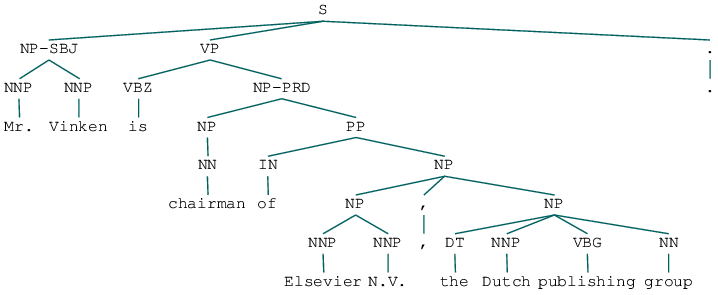

In [14]:
nltk.corpus.treebank.parsed_sents()[1]